# Lab 3: Build your first AI model

<font color="red">**Deadline: Monday 24th February, 5pm.**</font>

So far, you have learned the fundamentals of Python, and been introduced to some data science techniques: you can now manipulate and perform operations on data using the `numpy`, and `pandas` libraries, and create beautiful data visualisations with `matplolib`. You now have all the tools you need to build your very first AI system!

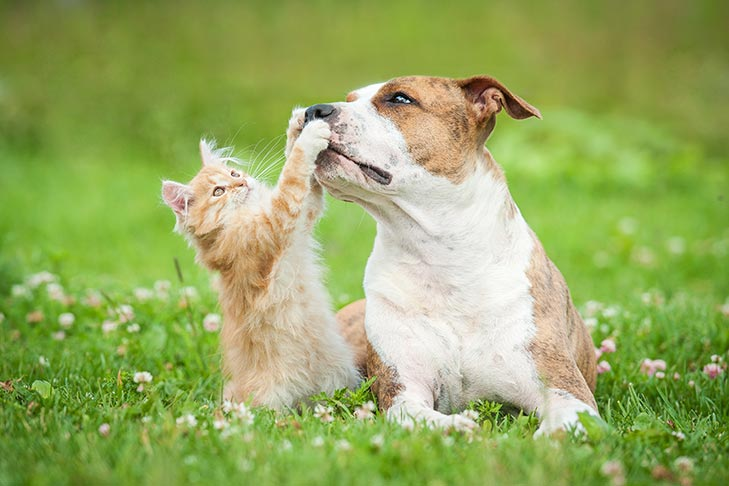

**Credit**: Written by [Gabrielle Gaudeau](https://www.cst.cam.ac.uk/people/gjg34) for the [Cambridge Higher Aspirations Scheme (CHAS)](https://www.cai.cam.ac.uk/access-outreach/caius-link-areas/cambridge-higher-aspirations-scheme) using:
-  The publicly available [Dogs vs. Cats](https://www.kaggle.com/competitions/dogs-vs-cats/overview) 2013 Kaggle competition dataset.
- [Tobias Roeschl](https://towardsdatascience.com/animations-of-logistic-regression-with-python-31f8c9cb420)'s animation in section 1.2.3.4.
- the foundational textbook [Speech and Language Processing](https://web.stanford.edu/~jurafsky/slp3/) by Dan Jurafsky and James H. Martin; more specifically the chapter on [Logistic Regression](https://web.stanford.edu/~jurafsky/slp3/5.pdf).

## 1. It's raining cats and dogs

As mentioned during the supervision, our first AI model will be a supervised model that classifies images as being images of cats or dogs.



First things first, we need some data.



### 1.1 Asirra Dataset

Web services are often protected with a challenge that's supposed to be easy for people to solve, but difficult for computers. Such a challenge is often called a <font color="springgreen">CAPTCHA (Completely Automated Public Turing test to tell Computers and Humans Apart)</font>. These are used for many purposes, such as to reduce email and blog spam and prevent brute-force attacks on web site passwords.

<font color="springgreen">Asirra (Animal Species Image Recognition for Restricting Access)</font> is a CAPTCHA that works by asking users to identify photographs of cats and dogs. This task is difficult for computers, but studies have shown that people can accomplish it quickly and accurately.


Asirra is unique because of its partnership with [Petfinder.com](https://www.petfinder.com/), the world's largest site devoted to finding homes for homeless pets. They've provided Microsoft Research with over three million images of cats and dogs, manually classified by people at thousands of animal shelters across the United States. The dataset you will work with is a subset of this data!

Here is an example of the Asirra interface:




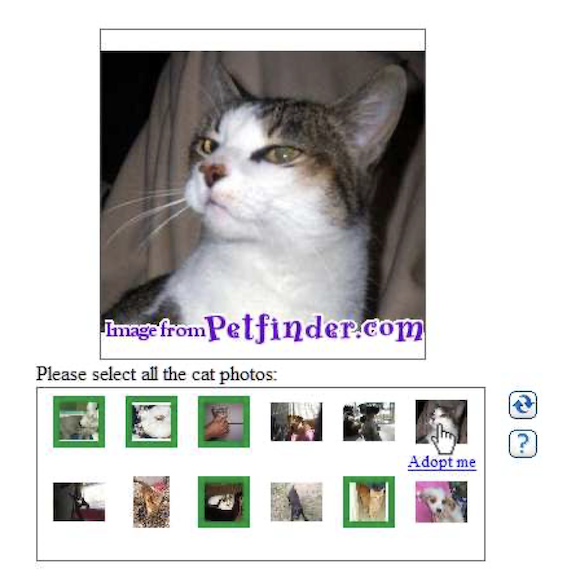

Image source: Elson, J., Douceur, J.R., Howell, J., & Saul, J. (2007). [Asirra: a CAPTCHA that exploits interest-aligned manual image categorization](https://gwern.net/doc/ai/2007-elson.pdf). Conference on Computer and Communications Security. Figure 1.


#### 1.1.1 Data Download

Let's start by downloading the dataset:

In [1]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2025-02-23 19:08:39--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.198.34.10, 2600:1407:3c00:f9b::317f, 2600:1407:3c00:f9d::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.198.34.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M  95.0MB/s    in 8.6s    

2025-02-23 19:08:48 (91.9 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



**Prefixing a code cell with the `!` character allows you to run <font color="springgreen">shell</font> commands (not Python). You do not need to know what a shell is for this course, but to give you an idea, the shell manages the interaction between you and the operating system. See [here](https://en.wikipedia.org/wiki/Shell_(computing)) to learn more about it.**

Next, we unzip the dataset folder (note that this may take a few seconds to run):

In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

Head over to the vertical menu bar on the far left of the screen below the Colaboratory logo (orange CO) and click on the folder icon to open the `Files` page. The dataset files you just downloaded and unzipped should appear:

1. The `PetImages` folder is the main body of the dataset. It contains two sub-folders called `Cat` and `Dog` which contain 12,499 numbered images of cats and 12,499 numbered images of dogs respectively in `.jpg` format.
2. The `CDLA-Permissive-2.0.pdf` file is the Data License Agreement which details the conditions under which we can use the dataset.
3. The `readme[1].txt` contains the link  to the research project.


As you hover mouse cursor over each individual files, they will be highlighted and an icon will appear (a stack of three dots) which opens up a `Menu`. Should you wish to, you can use it to `Download` the files to your computer and inspect them locally. You can also use the `Copy path` option. Now the <font color="springgreen">path</font> describes the location of a file in a computer's file system structure (for e.g., Finder on a Mac, File Explorer on a Windows or `Files` here). You will need this path to access the dataset in your code.

#### 1.1.2 Data Exploration

Now that we have successfully downloaded the dataset,
let's visualize a few images to get some sense of what it contains. To do this, we use both the `pyplot` module of `matplotlib` (which we introduced in the previous lab), as well as the `image` one which supports basic image loading operations:

In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

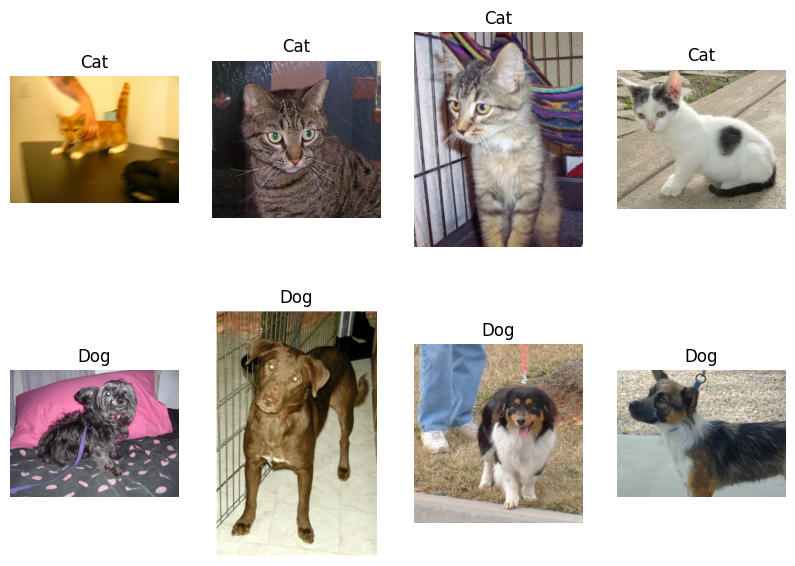

In [4]:
path = '/content/PetImages/'                # Set the path to the PetImages folder.

plt.figure(figsize=(10, 7))                 # Create a matplotlib plot and set its size: width, height in inches.

for i in range(4):
    cat = mpimg.imread(path + f'Cat/{i}.jpg') # Read the i-th image in the Cat folder.
    plt.subplot(2, 4, i+1)                    # Allows us to display a multiple plots (subplots) in one: here the first row.
    plt.imshow(cat)                           # Add cat image to the plot.
    plt.title('Cat')                          # Add title to subplot.
    plt.axis('off')                           # Do not display the subplot axes.

    dog = mpimg.imread(path + f'Dog/{i}.jpg') # Read the i-th image in the Dog folder.
    plt.subplot(2, 4, i+5)                    # Display the next plot in the second row.
    plt.imshow(dog)                           # Add dog image to the plot.
    plt.title('Dog')                          # Add title to subplot.
    plt.axis('off')                           # Do not display the subplot axes.

plt.show()                                  # Display the final plot.

As expected, our dataset contains images of cats and images of dogs. But, before we can use it to build our AI model, we first need to take a few more steps.

**Note that it's perfectly okay if you don't understand all of the code above. It is using functions which we did not introduce in the previous lab.**



**How are images stored in computers?**

An image is made of tiny, square-like elements called <font color="springgreen">pixels</font>. Each of these pixels is denoted by numerical numbers called <font color="springgreen">pixel values</font> which denote the intensity and colour of the pixel. You can think of an image as a <font color="springgreen">matrix</font> (2-dimensional array) of all of its pixel values. In <font color="springgreen">greyscale images</font> (black and white), pixel values are integers which range from 0 to 255, from black to white (and all the shades of grey in between). On the other hand, images with colour are usually stored as <font color="springgreen">RGB images</font>. In RGB images, a single pixel has three colour channels (red, green and blue), hence pixel values are given as 3-dimensional tuples of integer values from 0 to 255.

For example:
- a cyan pixel has a pixel value of <font color="cyan">(0, 255, 255)</font>,
- a red pixel <font color="red">(255, 0, 0)</font>,
- an orange pixel <font color="orange">(255, 128, 0)</font>,
- a black pixel in RGB is <font color="black">(0, 0, 0)</font>.


<font color="deeppink">**[Exercise]** Without looking it up, what do you think is the pixel value for a white pixel in an RGB image? What about blue? Or yellow?

**Write your answer here!** Keep it short (1-2 sentences).

using what i know about RRGGBB,

a white pixel would be given by #FFFFFF, or (255,255,255)

a blue pixel would be given by #0000FF or (0,0,255), but you could change the last value to get different blues

I'd guess a yellow pixel would be given by some combination of red and green like the orange pixel shown, so (180,128,0) maybe?


#### 1.1.3 Data Processing

Before we can use this data for learning, we first need to merge the content of the `Cat` and `Dog` folders to form one easily usable dataset of images $X$ and their associated labels $Y$. For simplicity, we will use numeric labels to represent the two classes: `0` for `cat` and `1` for `dog`.

Next, we need to resize the images to the same shape for consistency (in section 1.1.2, we can see that the images are different shapes and sizes) and convert them to a grayscale (eliminate colour information leaving the images in black and white) to reduce how large the images are (in terms of memory).

Finally, to make downstream computations more efficient we can <font color="springgreen">normalise</font> pixel values to be between 0 and 1 (which changes the range of pixel intensity values) without too much loss of information.

Here is the code (it may take a minute to run):

In [5]:
import os               # Library which provides functions for interacting with the operating system.
import numpy as np      # We are already familiar with numpy from Lab 1.

from PIL import Image   # A huge image processing library, beyond what matplotlib.image offers.

In [6]:
path = '/content/PetImages/'                  # Set the path to the PetImages folder.

images = []
labels = []

for folder in ['Cat', 'Dog']:                 # Loop through the Cat, then the Dog folder.
    directory = path + folder                 # Set the path to the Cat, the the Dog directory.

    for filename in os.listdir(directory):    # Loop through every file in the directory.
        extension = filename.split('.')[1]    # Returns what is after the dot in the filename.

        if extension == 'jpg':                # Check the extension of the file: only proceed if it is an image (jpg).
            try:
                # Open the image which corresponds to the filename, and convert it to grayscale.
                image = Image.open(os.path.join(directory, filename)).convert('L')

                image = image.resize((80, 80))  # Resize the image to 80 pixels in width and height.
                pixels = np.asarray(image)      # Get the resulting array of pixels values (image).
                pixels = pixels / 255.0         # Normalise the pixel values to [0,1] range.
                images.append(pixels)           # Add processed image to list.

                # Add image corresponding label: 1 for dog, 0 for cat.
                labels.append(1 if folder == 'Dog' else 0)

            except Exception:                   # Some images of the dataset are corrupted meaning they are unusable.
                print(filename)                 # Print out the filenames fo the corrupted image.

666.jpg
11702.jpg


/usr/local/lib/python3.11/dist-packages/PIL/TiffImagePlugin.py:949: UserWarning: Truncated File Read
  warnings.warn(str(msg))


**If an error occurs in a `try` statement, the code in `except` allows you to handle it without interrupting the program.** For example, here we print the names of the corrupted files for reference.

**Note again that it's perfectly okay if you don't understand all of the code above, but try to follow the steps by reading the comments.**

Now that we've processed the dataset, let's store it in a `DataFrame` (refer to Lab 2) and shuffle it:
      

In [7]:
import pandas as pd

In [8]:
dataset = pd.DataFrame(data={'images': images, 'labels': labels})

dataset= dataset.sample(frac=1).reset_index(drop=True)       # Shuffle the dataset, then reset the index column.
display(dataset.head(n=5))                                   # Display the first 5 rows of the dataset.

,images,labels
0,"[[0.2901960784313726, 0.32941176470588235, 0.3...",0
1,"[[0.3333333333333333, 0.37254901960784315, 0.2...",1
2,"[[0.49411764705882355, 0.5019607843137255, 0.5...",0
3,"[[0.2823529411764706, 0.28627450980392155, 0.2...",0
4,"[[0.01568627450980392, 0.01568627450980392, 0....",1


Notice that images are indeed a 2-dimensional arrays (as we described at the end of section 1.1.2). Let's check the shape of the first one:

In [9]:
dataset['images'][0].shape

(80, 80)

We have successfully resized the image to 80 pixels in width and height. Below we take a final look at our images after processing:

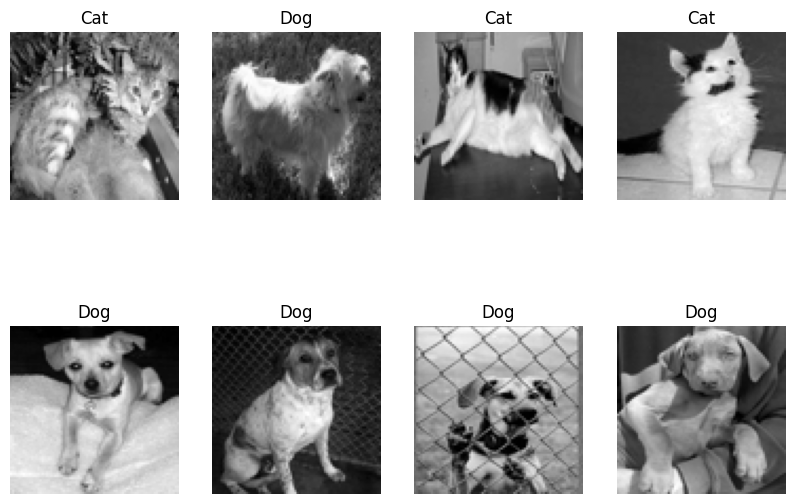

In [10]:
plt.figure(figsize=(10, 7))                 # Create a matplotlib plot and set its size: width, height in inches.

for i in range(8):
    row = dataset.iloc[i]                     # Get the ith row in the dataset table.
    image = row['images']
    label = 'Cat' if row['labels'] == 0 else 'Dog'

    plt.subplot(2, 4, i+1)                    # Allows us to display a multiple plots (subplots) in one: here the first row.
    plt.imshow(image, cmap='gray')                         # Add image to the plot.
    plt.title(label)                          # Add label to subplot.
    plt.axis('off')                           # Do not display the subplot axes.

plt.show()                                  # Display the final plot.

**Notice that due to resizing, some images are slightly squashed or pulled. This may affect the quality of our results, but overall the quality of our data is good and takes much less memory than it did originally.**

For convenience we will flatten our (80 x 80) images into single column vectors of length 80 x 80 = 6,400. Our natural intuition is that flattening separates adjacent pixels, so surely there is some information being lost here? Actually no. The geometric relationships can still be learned by a model. Think about it: a model does not know what an image is, only learns patterns from the data you give it, whatever form it has.

While flattening is less interpretable to us humans, a vector as input is much easier to handle and the mathematics are easier. Let's flatten:


In [11]:
# Print first image in dataset: before flattening.
print(dataset.images[0])
print(dataset.images[0].shape)

[[0.29019608 0.32941176 0.31372549 ... 0.07058824 0.2627451  0.40784314]
 [0.18823529 0.17647059 0.16078431 ... 0.12941176 0.34901961 0.36078431]
 [0.18823529 0.1372549  0.15686275 ... 0.30980392 0.37254902 0.33333333]
 ...
 [0.2745098  0.21568627 0.27843137 ... 0.14117647 0.14117647 0.1254902 ]
 [0.18431373 0.23921569 0.23921569 ... 0.14117647 0.13333333 0.1254902 ]
 [0.16078431 0.22352941 0.2        ... 0.14117647 0.12941176 0.12156863]]
(80, 80)


In [12]:
# Flatten to (6400,) vector.
flat_images = [i.reshape((6400,)) for i in dataset.values[:,0]]

# Update the image column of our dataframe.
dataset.images = flat_images

# Print first image in dataset: after flattening.
print(dataset.images[0])
print(dataset.images[0].shape)

[0.29019608 0.32941176 0.31372549 ... 0.14117647 0.12941176 0.12156863]
(6400,)


#### <font color="deeppink">**[Exercise]** 1.1.4 Data Analysis

<font color="deeppink"> Now that our data is safely stored in a `DataFrame`, you can easily manipulate it.

<font color="deeppink"> Let's see if you remember some things from the previous lab:
1. Plot a pie chart showing the distribution of cat versus dog images in the dataset. Don't forget to add a title and labels.
2. Describe the distribution of images in the dataset. Do you think it is important for a dataset to be balanced (roughly the same number of dog and cat images)? Try to justify your answer.

*Tip: you might want to use the* `np.sum()` *function which can take a boolean condition to compute the total number cat labels* `0` *and dog labels* `1` *stored in* `dataset['labels']`*.*</font>

Text(0.5, 1.0, 'Distribution of cats and dogs in the given dataset')

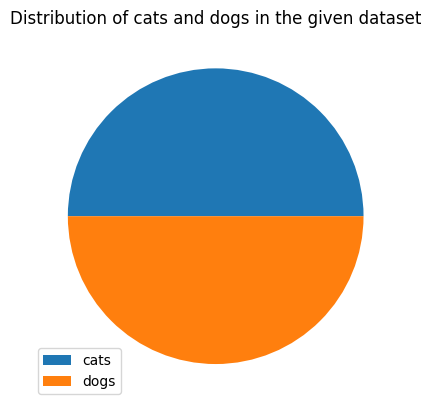

In [45]:
import matplotlib.pyplot as plt
total = len(dataset.labels)

dogs = np.sum(dataset.labels)
cats = total - dogs

plt.pie([cats,dogs])
plt.legend(["cats", "dogs", ], loc = "lower left")
plt.title("Distribution of cats and dogs in the given dataset")

In [44]:
0

0

**Write your answer here!** Keep it short (1-2 sentences).
in my opinion, while it might be good for the dataset to be balanced so that the chance of it detecting a cat or dog correctly are the same, I think the overall quantity of images of both are more important. This is because it is more important for it to actually recognise the features of each.

#### 1.1.5 Data Splitting

In machine learning, data splitting is when we divide our dataset into three subsets so that a model can be trained, evaluated and tested. The resulting subsets are:
1. the <font color="springgreen">training set</font>; a machine learning model learns by example, examples which are taken from the training set. In doing so, the model will learn to fit its  <font color="springgreen">parameters</font> (more on this in section 1.2.2) to find the expected outputs. This is generally the largest of the three subsets.
2. the <font color="springgreen">validation set</font>; when building a model for an application, we generally train more than one model by changing some parameters or using different algorithms. This step ensures that we obtain the best possible model in the end and is called <font color="springgreen">tuning</font>. If we use the same data for training and tuning, we risk over-fitting our model to the training data so much that it will become incapable of <font color="springgreen">generalisation</font> (i.e., it will be bad at classifying previously unseen images which defeats the whole purpose of building a model).
3. the <font color="springgreen">test set</font>; after we've trained, tuned, and selected a final model, we test its performance on a held-out subset of the data as a final form of evaluation.

We've already shuffled our `dataset` so we can just split it using row indices. Let's find out how many images we have:

In [46]:
len(dataset.images)

24998

We can take the first 20,000 images for our training set (~80%) and then evenly divide the remaining 4,998 images between the validation and test set:

In [47]:
train_set = dataset.iloc[:20000,:]
val_set = dataset.iloc[20000:22499,:]
test_set = dataset.iloc[22499:,:]

#### 1.1.6 Wrap-up

You may notice that we have spent a great deal of time and effort preparing our data. In fact, this will mostly always be true of any AI project. As the saying goes "You are what you eat". This is also true in machine learning: the data is what you feed a machine learning system. Good quality data is essential, and you also need to spend time preparing it: making it consistent, taking the time to properly analyse it, etc. This is why we spent all that time learning about data science previously.

### 1.2 Model

Now that our data is ready, we move on to the hard part: the machine learning. The first part of this section will be quite theoretical and math-heavey, hang in there. The fun coding part will shortly follow.

 As mentioned during the supervision presentation, we will only be learning about <font color="springgreen">supervised learning</font> in this course: that is, we will be looking at machine learning models that learn from labeled data. Now, supervised learning can be further split into two types of tasks:
1. <font color="springgreen">classification</font> which is about predicting a discrete class label (for e.g., whether an image is of a `cat` or of a `dog`),
2. and <font color="springgreen">regression</font>
which is about predicting a continuous quantity (for e.g., the profit the ice-cream truck will make given the temperature at noon that day).

In this lab, you will be implementing a simple classification model called a <font color="springgreen">logistic regression</font>.

#### 1.2.1 Logistic Regression

Logistic regression is a widely used statistical algorithm that can be used to model the **probability of a certain class label**. It is fast and relatively uncomplicated, and is usually used for binary classification (exactly two classes, like here `cat` and `dog`, `0` and `1`).

To understand what logistic regression is and how it works, you will need an understanding of the <font color="springgreen">sigmoid function</font> $\sigma$ (pronounced "sigma") given by the following equation for all values of $z$:

$$ \sigma(z) = \frac{\mathrm{1}}{\mathrm{1} + e^{-z}}.$$

Let's plot it:

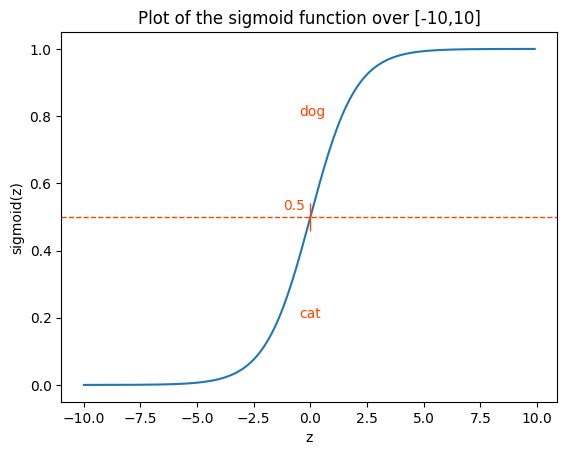

In [48]:
x = np.arange(-10, 10, 0.1)     # Returns an array of evenly spaced values within the given interval.
z = 1/(1 + np.exp(-x))          # Compute the sigmoid function for all of the values in x.

plt.plot(x, z)                  # Plot x against z.

# Add vertical line and intercept to show the classification boundary.
plt.axhline(y = 0.5, color='orangered', linestyle='dashed', linewidth=1)
plt.plot(0, 0.5, marker='|', color='orangered', markersize=20)
plt.annotate(text="0.5", xy=(-1.2, 0.52), color='orangered')

# Add floating labels to show where cat/dog will be predicted on sigma.
plt.annotate(text='dog', xy=(-0.5, 0.8), color='orangered')
plt.annotate(text='cat', xy=(-0.5, 0.2), color='orangered')

plt.xlabel('z')                 # Add a label to the x-axis.
plt.ylabel('sigmoid(z)')        # Add a label to the y-axis.
plt.title('Plot of the sigmoid function over [-10,10]')   # Add a title.

plt.show()                      # Display the plot.

**Recall that in machine learning, we want to learn a function that maps an input to an output.** In our case, we want to learn a function that maps an image to 0 if it is an image of a cat or to 1 if it is an image of a dog (for this task, we're not interested in any other kinds of images).

As you can see, the sigmoid function has the ability to map any real-valued $z$ into another value $\sigma(z)$ between 0 and 1. In fact, judging by its shape, values are generally either very close to 0, or very close to 1. In practice, we choose a threshold value (here 0.5) above which round up values to `1` (dog) and under which we round down values to `0` (cat). This is called the <font color="springgreen">classification boundary</font>. In doing so, we can use the logistic function to return a binary outcome which makes it suitable for our application.

#### 1.2.2 Model Weights

Recall that after processing our images in section 1.1.3, we flattened them to obtain column vectors of length 6,400 (for each pixel in an 80 x 80 image). How do we go from an image to the probability of its class? That is, how do we go from an image vector to a single valued $z$ that can be inputted to $\sigma$ to obtain a class probability between 1 and 0? And where does the "learning" come in? Before we can answer these questions, we need to introduce some mathematical notations.

Let $\overrightarrow{x_i}$ be the $i$-th image (index = $i$)  in our `dataset` such that $$\overrightarrow{x_i} = (x_{i_1}, x_{i_2}, \cdots, x_{i_{6400}})$$ where $x_{i_1}, x_{i_2}, \cdots, x_{i_{6400}}$ are real-valued (this is just the flattened pixel matrix), and $y_i$ be its associated class (either $y_i$ = 1 or $y_i$ = 0).


Now, if we let $X$ denote the `train_set` images. Then $X$ is a matrix of size 6,400 x 20,0000 (rows x columns), where the $i$-th column of $X$ is the vector form of the the $i$-th image in the `train_set`. That is,

$$X = \begin{pmatrix} \overrightarrow{x_1}, \overrightarrow{x_2}, \cdots, \overrightarrow{x_{20000}} \end{pmatrix}.$$

_Note: Hopefully this mathematical notation isn't too scary, but don't worry if this is all a bit too much. The intuition is just that every column of $X$ is an image (arguably a very flat image)._


Logistic regression solves the task of image classification by _learning_, from the training set $X$, a vector of <font color="springgreen">weights</font> $\overrightarrow{w} = (w_1, w_2, \cdots, w_{6400})$ and a <font color="springgreen">bias term</font> $b$. These are called the <font color="springgreen">coefficients</font> or <font color="springgreen">parameters</font> of the model.

Each weight $w_j$ is a real number, and is associated with one of the input features $x_{i_{j}}$. These weights represents how important that specific pixel is to the classification decision. They can be positive (providing evidence that the image being classified belongs in the dog class `1`) or negative (providing evidence that the image being classified belongs to the cat class `0`).

Then, to obtain a probability from an image vector $\overrightarrow{x_i} \in X$, we first multiply each $x_{i_j}$ by its associated weight $w_j$, sum them up, and add the bias term $b$. The result is a single real value $z_i$ that can then be passed to $\sigma$. In other words:

$$ z_i = \overrightarrow{w} \cdot \overrightarrow{x_i} + b$$

where we represent the sum of the products as the dot product of  $\overrightarrow{x_i}$ and $\overrightarrow{w}$. The resulting single number $z_i$ expresses the weighted sum of the evidence for the class of the image $\overrightarrow{x_i}$.

For our use case, the best weights would result in a model that would predict a value very close to `1` for images of dogs, and a value very close to `0` for images of cats.  How do we learn them?





#### 1.2.3 Maximum-Likelihood Estimation

To estimate the model weights from our data, we use <font color="springgreen">maximum-likelihood estimation (MLE)</font>, a common learning method. In simple terms, it is a **search procedure** which seeks values for the coefficients $b, \overrightarrow{w}$ that **minimise the error in the probabilities predicted by the model** on the training data (for which we have labels). To do so, MLE maximises the  <font color="springgreen">likelihood function</font> or equivalently minimises a  <font color="springgreen">cost function</font>.




##### 1.2.3.1 Likelihood Function

The <font color="springgreen">likelihood function</font> quantifies the probability of observing our data (our images of cats and dogs) given our logistic regression model and its parameters (here $b, \overrightarrow{w}$). The better our model is at predicting our data, the better our model.

Specifically, the likelihood function is the product of the individual probabilities of each image in $X$ modelled by the sigmoid function $\sigma$ with respect to $b, \overrightarrow{w}$. From here onwards, we let $\theta = (\overrightarrow{w}, b)$.

Now, for every dog image $\overrightarrow{x_i} \in X, y_i = 1$, we want $\sigma_{\theta}(z_i)$ to be as close to 1 as possible. Similarly, for every cat image $\overrightarrow{x_i} \in X, y_i = 0$, we want $\sigma_{\theta}(z_i)$ to be as close to 0 as possible; in other words $1 - \sigma_{\theta}(z_i)$ should be as close to 1 as possible. Mathematically, we can combine these products to obtain:

$$ L(b, \overrightarrow{w}) = \prod_{i = 1}^{20000} \sigma_{\theta}(z_i)^{y_i} (1 - \sigma_{\theta}(z_i))^{1 - y_i},$$

where our training data $X$ contains 20,000 images, and for every image vector $\overrightarrow{x_i} \in X$, $y_i$ is its observed class (either `0` for cat or `1` for dog) and $z_i$ is given in section 1.2.2 in function of $\theta$.

_Note: Hopefully this mathematical notation isn't too scary, but don't worry if this is all a bit too much. It looks like a lot but really just try plugging-in $y_i = 0$ or $y_i = 1$ and the expression will simplify. Having a intuition for this is already great and you can always come back to the nitty-gritty stuff later if you are interested._

Wrapping up: the best parameters $\theta$ will be the ones that **maximises** this product. Intuitively, we want our model to learn our training data as faithfully as possible.



##### 1.2.3.2 Log Likelihood

Now, if we consider that probabilities are relatively small (they lie between 0 and 1). A product of many thousands of probabilities (since our dataset has thousands of images) will make $L$ really, really, realllllllyyy small, which is neither practical nor computationally great.

Instead, if we take the logarithm of $L$, our product of probabilities is transformed into a sum of logarithms, which is generally easier to work. We call this the <font color="springgreen">log likelihood</font> and denote it $l$:

$$ l(\theta) = \sum_{i = 1}^{20000} y_i \mathrm{log}(\sigma_{\theta}(z_i)) + (1 - y_i) \mathrm{log} (1 - \sigma_{\theta}(z_i)).$$

Our target remains the same: **maximising** $LL$ such that we can find the best coefficients $\theta$.


##### 1.2.3.3 Negative Log Likelihood

Notice that taking the logarithm of probabilities (between 0 and 1) will always return negative values. Traditionally, we multiply the log likelihood by -1, in order to obtain positive values instead. We call this the <font color="springgreen">negative log-likelihood</font> or the <font color="springgreen">cross-entropy function</font> and denote it $J$:

$$ J(\theta) = \sum_{i = 1}^{20000} -y_i \mathrm{log}(\sigma_{\theta}(z_i)) - (1 - y_i) \mathrm{log} (1 - \sigma_{\theta}(z_i)).$$

This is what we call a <font color="springgreen">cost function</font>. It represents the **error between the true data $y_i$** (whether a given image in our dataset is actually an image of a cat or a dog) and the **predicted data** $\sigma_{\theta}(z_i)$ (what our model predicts that given image to be) that we want to **minimise**.

Now that we have the function that represents our optimisation objective, how do we actually learn the parameters $\theta$ in MLE?


##### 1.2.3.4 Convexity

<font color="springgreen">Convexity</font> of the cost function is a desirable property for optimisation methods like MLE because it guarantees that there is a unique global minimum, and any local minimum is also a global minimum. Recall that a <font color="springgreen">global minimum</font> is the smallest overall value of a function over its entire range, whereas a <font color="springgreen">local minimum</font> is a minimum within some neighborhood but not necessarily over the entire range of the function.


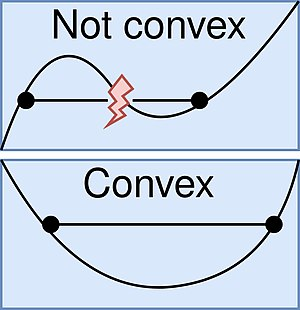


Unfortunately, the negative log-likelihood function is often non-convex due to the <font color="springgreen">non-linear</font> nature of the logistic function (a function that does not graph into a straight line and does not have a constant slope). That means that it can have multiple local minima which can make it challenging to find the optimal set of model parameters $\theta$.

##### 1.2.3.5 Gradient Descent

To optimise the parameters in logistic regression, iterative optimisation algorithms like <font color="springgreen">gradient descent</font> are commonly used. **These algorithms may converge to a local minimum, but there is no guarantee that the found solution is the global minimum.**

In gradient descent, we adjust parameter values proportional to the negative gradient of our cost function until we reach <font color="springgreen">convergence</font>. Imagine a ball rolling down a hill. The ball tends to move in the direction of the fastest decrease until it reaches the bottom. It starts by gaining momentum and then slows down to a stop. The idea behind gradient descent is similar: you start with an arbitrarily chosen point $\theta = (\overrightarrow{w}, b)$ and move it iteratively in the direction of the fastest decrease of the cost function.

Mathematically, this can be expressed with the following formula:

$$\theta_{e+1} = \theta_{e} - \alpha \nabla J({\theta_e}) $$

Let's unpack this together:
- $e$ is the previous epoch or timestep; so $\theta_e$ represents the parameters at the previous timestep $e$ and $\theta_{e+1}$ represents the updated parameters at the next timestep $e+1$.
- $\alpha$ is the learning rate; if it is too small, gradient descent will be slow, if it is too large, gradient descent may overshoot the minimum and fail to converge.
- $\nabla J({\theta_e})$ is the <font color="springgreen">gradient</font> of our cost function at the previous timestep $e$; the gradient denotes the direction of greatest change of a function (which is what we are interested in). Specifically, it is computed using partial derivatives:

$$\nabla J({\theta}) = \frac{\partial J)}{\partial \theta} =  \begin{pmatrix} \frac{\partial J}{\partial \overrightarrow{w}} \\ \frac{\partial J}{\partial b} \end{pmatrix}.$$

We say that gradient descent has converged, when you reach a set of weights $\theta$ for which $\nabla J({\theta})$ is 0. However, it may take a while for the function to reach exactly 0 so we can add additional constraints to the stopping conditions of a gradient descent algorithm: such as "only perform 200 iterations and then stop" or "stop when you have not improved the output in the last 10 iterations".


For intuition, look at the animation below. Suppose the blue crosses are examples taken from our training dataset: at the top ($y = 1$) are images of dogs, and at the bottom are images of cats ($y = 0$). We initialise our model's weights randomly, and then run gradient descent iteratively. In doing so, our cost diminishes (i.e., our model improves), as we go steadily down the surface of costs and learn better weights. Cool right?

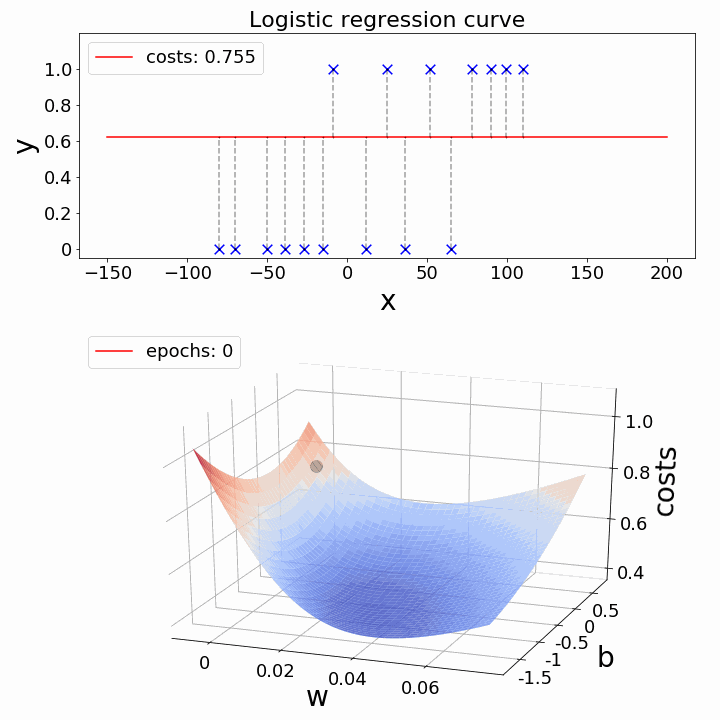

##### <font color="orange">**[Optional]** 1.2.3.6 Some Calculus

<font color="orange">How do we derive $\nabla J({\theta})$? Feel free to get some pen and paper and try things out if you like Calculus. Otherwise you can read this [demonstration](https://medium.com/@ashisharora2204/logistic-regression-maximum-likelihood-estimation-gradient-descent-a7962a452332). Note that while you can skip the math, you will need the result of the next exercise.<font>




#### <font color="deeppink">**[Exercise]** 1.2.4 Model Training

<font color="deeppink">Let's have you try implementing the `gradient_descent()` function for our logistic regression. I have already implemented the `gradients()` and `sigmoid()` functions for you to use.
1. Start by randomly initialising the weight vector $\overrightarrow{w}$ and bias term $b$.
_Tip: you might want to use the [np.random.uniform()](https://numpy.org/doc/stable/reference/random/generated/numpy.random.uniform.html) function. Further, the strength of python is vector/matrix multiplication so use it: you don't need to separate the bias term up until the end (when you return it)._
2. Then write a `loop` such that you update the parameters `nb_iterations` times using the formula above.
3. Finally return the "best" set of weights $\theta$ you've learned: first the bias term `b` and then the `weights` vector.
</font>

<font color="deeppink">_Tip: I recommend printing the number of iterations in your loop, so that you can keep track of how long it is taking to run._





In [ ]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))


def gradients(X, y, theta):
    '''
    Compute the gradients of the cost function J with regards to theta.

    Parameters:
              X (6400 x 20000 numpy matrix): the train-set
              y (numpy array of 20000 values): the associated class of each x in X; either 1 (dog) or 0 (cat)
              theta (numpy array of 6401 values): the model's parameters (w1, w2, ..., w6400, b).
    '''
    z = np.dot(X, theta[1:]) + theta[0]
    predicted_y = sigmoid(z)

    n = X.shape[0] # Get the number of training examples; i.e., 20,000.

    dw = (1/n)*np.dot(X.T, (predicted_y - y)) # Gradient of cost with regards to the weights.
    db = (1/n)*np.sum((predicted_y - y))      # Gradient of cost with regards to the bias term.

    return np.append(dw, db)

In [ ]:
def gradient_descent(X, y, alpha=0.001, nb_iterations=200):
    '''
    Perform the gradient descent algorithm.

    Parameters:
              X (6400 x 20000 numpy matrix): the train-set
              y (numpy array of 20000 values): the associated class of each x in X; either 1 (dog) or 0 (cat)

              alpha (float): learning rate; defaults to 0.001
              nb_iterations (int): number of times the algorithm should run; defaults to 200
    Returns:
              b (float): learned "best" bias term
              weights (numpy array of 6400 floats): learned "best" weight vector
    '''

    # Your implementation here...
    theta = ...
    return None, None

Let's test your code:

In [ ]:
import warnings
warnings.filterwarnings('ignore')

X_train = np.array([i for i in train_set.values[:,0]])
y_train = train_set.labels.values
b, weights = gradient_descent(X_train, y_train)

In [ ]:
print(f'Bias term: {b}')
print('Weights vector:')
print(weights)

In learning the weights and bias term, you have successfully trained a dog/cat image classification model! Congratulations.

#### 1.2.5 Tuning and testing

We're not technically done yet. As we mentioned in section 1.1.5, when developping a AI model for an application there is usually a tuning and a testing step. We will skip the tuning step for now and test our model on our `test_set` to see if it's any good.

<font color="springgreen">Accuracy</font> is the standard metric used to evaluate classification models. Informally, accuracy is the fraction of predictions our model got right. Formally, accuracy is given by:
`accuracy = nb_correct_predictions / nb_total_predictions`.

Let's try it out:

In [ ]:
nb_correct_predictions = 0
nb_total_predictions = 0

X_test = np.array([i for i in test_set.values[:,0]])
y_test = train_set.labels.values

for x, label in zip(X_test, y_test):
    nb_total_predictions += 1

    z = np.dot(x, weights) + b
    if (sigmoid(z) < 0.5 and label == 0) or (sigmoid(z) >= 0.5 and label == 1):
        nb_correct_predictions += 1

accuracy = nb_correct_predictions / nb_total_predictions
print(accuracy)

Since we have two classes, we want to see that our model performs at least better than 50% of the time. It's very okay if yours currently doesn't. The techniques shown here were very simple and we have not even tuned our model. For now, feel free to play around with the learning rate `alpha` and the `nb_iterations` to see if you can improve your results.

## 2. Summary

This lab was a lot. I know. But know that this was by far the hardest part of our whole course. In practice, you will hardly ever need to implement this again, because it has already been implemented better by other people in libraries. Even if you did not manage to complete section 1.2.4 that's really okay. We will go through it together in the next supervision. The most important thing is that you read and try to understand the intuition behind all of this. And ideally try to learn some cool Machine Learning vocabulary at the same time.


## <font color="orange">3. **[Optional]** Resources/further reading</font>

There are hundreds of excellent resources online for learning more about classification:

* Check out this [Kaggle notebook](https://www.kaggle.com/code/abdelrahmanahmed110/cats-vs-dogs-classification) if you want to see an implementation of logistic regression on this same dataset but using pre-existing libraries (not coding it all from scratch like we did). More generally the dataset comes from an old Kaggle competition. All the competition entries are public and you can learn a lot from them.
* I also recommend checking out the foundational textbook [Speech and Language Processing](https://web.stanford.edu/~jurafsky/slp3/) by Dan Jurafsky and James H. Martin. More specifically the chapter on [Logistic Regression](https://web.stanford.edu/~jurafsky/slp3/5.pdf). It's freely accessible online, and is THE reference textbook in AI.

## 4. Uploading your work

Congrats on getting to the end! This is a lot of information, and it might seem overwhelming but don't worry you're learning some really important stuff, and if you feel like you're struggling don't worry that's what supervisions are for.

<font color="red">**Once you are done, remember to save the notebook in the `Lab 3` folder which sits in the `Student Work Upload` folder.**</font>

See you in the next supervision!